<div style="text-align:center; font-size:40px; color:white; font-weight:bold; padding:10px; border-radius:10px;">
    Trip Duration EDA <br> 
    <span style="font-size:30px; font-weight:normal;">By Ahmed Reda</span>
</div>


### Dataset Description

- **id** - A unique identifier for each trip  
- **vendor_id** - A code indicating the provider associated with the trip record  
- **pickup_datetime** - Date and time when the meter was engaged (Start of the trip)  
- **passenger_count** - The number of passengers in the vehicle (driver entered value)  
- **pickup_longitude** - The longitude where the meter was engaged  
- **pickup_latitude** - The latitude where the meter was engaged  
- **dropoff_longitude** - The longitude where the meter was disengaged  
- **dropoff_latitude** - The latitude where the meter was disengaged  
- **store_and_fwd_flag** - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server  
  - **Y** = Store and forward  
  - **N** = Not a store and forward trip  
- **trip_duration** - Duration of the trip in seconds  

> **Note:** `trip_duration` is the **target** variable.


# Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')


# Dataset & Some_Statistics

In [2]:
train = pd.read_csv(r'D:\Course Mostafa Saad\HomeWork\Taxi_Trip\Data\split\train.csv')
val = pd.read_csv(r'D:\Course Mostafa Saad\HomeWork\Taxi_Trip\Data\split\val.csv')

# Combine the files
data = pd.concat([train, val])

# Save the combined file
data.to_csv('combined.csv', index=False)

In [3]:
# showing dataset
data.sample(5)

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
723359,id2757786,1,2016-03-24 22:40:04,1,-73.979691,40.781593,-73.968704,40.791653,N,246
641350,id0284230,1,2016-05-28 01:19:26,1,-73.948540,40.778065,-73.936249,40.794765,N,234
295020,id0130998,1,2016-01-06 18:18:55,1,-73.961777,40.773849,-73.968063,40.767860,N,283
59268,id1968200,1,2016-03-09 00:24:06,2,-73.984360,40.725010,-73.993248,40.719475,N,352
54665,id1443758,2,2016-06-01 13:04:24,5,-74.008301,40.734592,-73.991158,40.736591,N,1302


In [4]:
# Shape of DataSet
print(f"Number of column :{data.shape[1]}\nNumber of rows :{data.shape[0]}")

Number of column :10
Number of rows :1229319


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1229319 entries, 0 to 229318
Data columns (total 10 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   id                  1229319 non-null  object 
 1   vendor_id           1229319 non-null  int64  
 2   pickup_datetime     1229319 non-null  object 
 3   passenger_count     1229319 non-null  int64  
 4   pickup_longitude    1229319 non-null  float64
 5   pickup_latitude     1229319 non-null  float64
 6   dropoff_longitude   1229319 non-null  float64
 7   dropoff_latitude    1229319 non-null  float64
 8   store_and_fwd_flag  1229319 non-null  object 
 9   trip_duration       1229319 non-null  int64  
dtypes: float64(4), int64(3), object(3)
memory usage: 103.2+ MB


- The `pickup_datetime` column is of type **object** and needs to be converted to **datetime**.
- The `id` column can be **dropped** as it is not needed for analysis.
- All other columns are **ready** for visualization, feature generation, and model training.

In [6]:
# Checking For Null Values
data.isnull().sum()

id                    0
vendor_id             0
pickup_datetime       0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

In [7]:
# Checking For Duplicated Values
data.duplicated().sum()

np.int64(0)

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
vendor_id,1229319.0,1.534912,0.498780,1.000000,1.000000,2.000000,2.000000,2.000000e+00
passenger_count,1229319.0,1.664531,1.314509,0.000000,1.000000,1.000000,2.000000,8.000000e+00
pickup_longitude,1229319.0,-73.973446,0.061780,-121.933342,-73.991852,-73.981728,-73.967346,-6.133553e+01
pickup_latitude,1229319.0,40.750928,0.033545,34.359695,40.737370,40.754108,40.768360,5.188108e+01
dropoff_longitude,1229319.0,-73.973395,0.061641,-121.933304,-73.991325,-73.979759,-73.963028,-6.133553e+01
dropoff_latitude,1229319.0,40.751816,0.036341,32.181141,40.735901,40.754532,40.769821,4.392103e+01
trip_duration,1229319.0,959.691748,5263.573404,1.000000,397.000000,662.000000,1075.000000,3.526282e+06



- The **minimum passenger count** is **0**, which could indicate a trip for delivering goods rather than carrying passengers, or it may be an outlier.  
- The **maximum passenger count** is **8**, which might also be an outlier.  
- The four columns (**pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude**) represent geographic coordinates and can be transformed into **distance-based features**.  
- The **trip_duration** can be transformed using a **logarithmic scale** to manage large variations and improve model performance.  


In [9]:
data.describe(exclude=np.number)

,id,pickup_datetime,store_and_fwd_flag
count,1229319,1229319,1229319
unique,1229319,1173138,2
top,id3770970,2016-05-07 13:18:07,N
freq,1,5,1222501


In [10]:
pd.DataFrame({
    'count':data.shape[0],
    'Nulls':data.isnull().sum(),
    'nulls%':data.isnull().sum()*100,
    'cardinality': data.nunique(),
})

,count,Nulls,nulls%,cardinality
id,1229319,0,0,1229319
vendor_id,1229319,0,0,2
pickup_datetime,1229319,0,0,1173138
passenger_count,1229319,0,0,9
pickup_longitude,1229319,0,0,22208
pickup_latitude,1229319,0,0,43809
dropoff_longitude,1229319,0,0,32222
dropoff_latitude,1229319,0,0,60233
store_and_fwd_flag,1229319,0,0,2
trip_duration,1229319,0,0,7147


In [11]:
print(data.columns)

Index(['id', 'vendor_id', 'pickup_datetime', 'passenger_count',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'store_and_fwd_flag', 'trip_duration'],
      dtype='object')



 
<div style="text-align:center; font-size:50px;  font-family: 'Courier New', monospace;  padding:10px; border-radius:10px;">
    Data Preparation
</div>



In [12]:
# convert pickup_datetime(object) to datetime
data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])

In [13]:
# Trip duration (Target Variable)
# perform log transform on trip_duration

data['trip_duration_log_transform'] = np.log1p(data['trip_duration'].values)

In [14]:
#drop id column
data.drop('id', inplace=True, axis=1)

In [15]:
#convert the seconds to minutes in trip duration coloumn to make it easy to read
data['trip_duration_minutes'] = data['trip_duration'] / 60
data['trip_duration_minutes'] = data['trip_duration_minutes'].round(2)

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1229319 entries, 0 to 229318
Data columns (total 11 columns):
 #   Column                       Non-Null Count    Dtype         
---  ------                       --------------    -----         
 0   vendor_id                    1229319 non-null  int64         
 1   pickup_datetime              1229319 non-null  datetime64[ns]
 2   passenger_count              1229319 non-null  int64         
 3   pickup_longitude             1229319 non-null  float64       
 4   pickup_latitude              1229319 non-null  float64       
 5   dropoff_longitude            1229319 non-null  float64       
 6   dropoff_latitude             1229319 non-null  float64       
 7   store_and_fwd_flag           1229319 non-null  object        
 8   trip_duration                1229319 non-null  int64         
 9   trip_duration_log_transform  1229319 non-null  float64       
 10  trip_duration_minutes        1229319 non-null  float64       
dtypes: datetime64[ns]

 
<div style="text-align:center; font-size:50px;  font-family: 'Courier New', monospace;  padding:10px; border-radius:10px;">
    Feature Engineering
</div>


In [17]:
# Define a function to calculate Haversine distance
def haversine(lat1, lon1, lat2, lon2):
    # Convert degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    
    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371  # Radius of Earth in kilometers
    return c * r

In [18]:
data['distance'] = data.apply(
    lambda row: haversine(row['pickup_latitude'], row['pickup_longitude'],
                          row['dropoff_latitude'], row['dropoff_longitude']),
    axis=1
)

In [19]:
# Create a new columns for weekday and hour and month and is_weekend
data['weekday'] = data['pickup_datetime'].dt.weekday #Weekends may have different traffic patterns compared to weekdays
data['hour'] = data['pickup_datetime'].dt.hour
data['month'] = data['pickup_datetime'].dt.month
data['is_weekend'] = (data['weekday'] >= 5).astype(int) #Binary flag indicating if the trip occurred on a weekend.

In [20]:
def time_of_day(hour):
    if 5 <= hour < 12:
        return 'morning'
    elif 12 <= hour < 17:
        return 'afternoon'
    elif 17 <= hour < 22:
        return 'evening'
    else:
        return 'night'

data['time_of_day'] = data['hour'].apply(time_of_day)

In [21]:
data['store_and_fwd_flag'] = (data['store_and_fwd_flag'] == 'Y').astype(int)

In [22]:
data.sample(5)

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,trip_duration_log_transform,trip_duration_minutes,distance,weekday,hour,month,is_weekend,time_of_day
149946,2,2016-03-02 20:37:08,2,-73.988319,40.764389,-73.992012,40.725491,0,1056,6.963190,17.60,4.336484,2,20,3,0,evening
508521,1,2016-05-13 23:34:08,1,-73.985329,40.747192,-73.993996,40.735535,0,199,5.298317,3.32,1.487784,4,23,5,0,night
812536,2,2016-05-09 11:03:38,1,-73.976212,40.761150,-73.974197,40.760502,0,128,4.859812,2.13,0.184330,0,11,5,0,morning
57155,1,2016-04-05 07:17:35,1,-73.977943,40.763348,-73.966721,40.790005,0,771,6.648985,12.85,3.111129,1,7,4,0,morning
959440,2,2016-02-09 07:24:23,1,-73.974861,40.758820,-73.970070,40.757900,0,1215,7.103322,20.25,0.416299,1,7,2,0,morning


<div style="text-align:center; font-size:50px;  font-family: 'Courier New', monospace;  padding:10px; border-radius:10px;">
    Features Analysis
</div>



# <span style="color:rgba(243, 238, 236, 0.86); font-size: 46px; text-align: left;">Univariate Analysis</span>

# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">vendor_id</span>

In [23]:
# Count occurrences of each vendor_id  
vendor_counts = data['vendor_id'].value_counts().reset_index()  
vendor_counts.columns = ['Vendor ID', 'Count']  

# Plot with more details using Plotly  
fig = px.pie(
    vendor_counts,  
    values='Count',  
    names='Vendor ID',  
    title='Proportion of Vendor IDs',  
    color_discrete_sequence=['skyblue', 'lightgreen'],  # Custom colors  
    hole=0.1  # Optional: makes it a donut chart  
)  

# Show the plot  
fig.show()

In [55]:
import plotly.express as px  

# Count occurrences of each vendor_id  
vendor_counts = data['vendor_id'].value_counts().reset_index()
vendor_counts.columns = ['Vendor ID', 'Count']

# Create Bar Chart  
fig = px.bar(
    vendor_counts,  
    x='Vendor ID',  
    y='Count',  
    text='Count',  
    title='Vendor ID Counts',  
    color='Vendor ID',  
    color_discrete_sequence=['red', 'purple'],    
)  

fig.update_traces(textposition='outside')  # Show count labels outside bars  
fig.show()



# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">pickup_datetime</span>

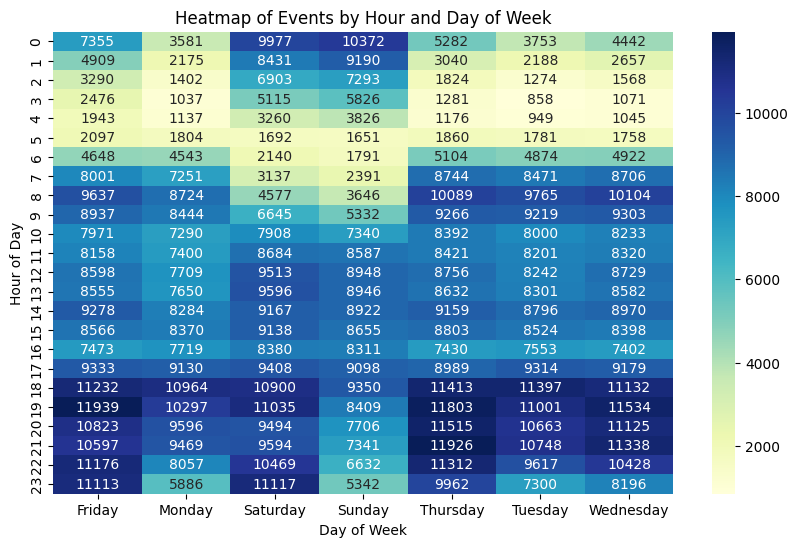

In [25]:
# Convert weekday numbers to actual day names
data['weekday'] = data['pickup_datetime'].dt.strftime('%A')

# Pivot the data for the heatmap, using weekday names
heatmap_data = data.pivot_table(index='hour', columns='weekday', aggfunc='size')

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='d')
plt.title('Heatmap of Events by Hour and Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Hour of Day')
plt.show()


#### 1. Interpretation:
- **Rows (Hour of Day)**: The rows represent the 24 hours of the day, starting from midnight (0:00) up to 23:00. Each row shows the count of trips during that specific hour for all days of the week.

- **Columns (Day of Week)**: The columns represent the days of the week. Each column corresponds to a day (e.g., "Monday", "Tuesday", etc.). The numbers inside the cells show the number of trips that occurred during that hour and on that specific day.

- **Cell Values**: The number inside each cell represents the count of trips that occurred during that specific hour on that specific day. The higher the number, the darker the shade of the color (as per the color map).

#### 2. Insights:
- **Busy Times**: By looking at the heatmap, you can easily identify the hours of the day when most trips occurred (indicated by darker colors), and you can compare this across different days of the week.

- **Trends**: You might see trends such as:
  - Weekdays like Monday to Friday having more trips during business hours.
  - Weekends (Saturday, Sunday) may have a different pattern (perhaps later or earlier in the day).

- **Outliers**: If certain time slots or days have unusually high or low numbers of trips, this might indicate outliers or patterns worth investigating.


In [26]:
# Group the data by month and count the occurrences
monthly_counts = data.groupby(data['pickup_datetime'].dt.to_period('M')).count()['month'].reset_index()

# Convert 'pickup_datetime' back to a string (or datetime)
monthly_counts['pickup_datetime'] = monthly_counts['pickup_datetime'].dt.to_timestamp()

# Creating the Figure instance
fig = px.line(
    monthly_counts, 
    x='pickup_datetime', 
    y='month', 
    title='Monthly Aggregated Time Series', 
    labels={'pickup_datetime': 'Month', 'month': 'Count'}
)

# Showing the plot
fig.show()


### Monthly Aggregated Time Series (Jan-May 2016)  
This graph visualizes a **monthly aggregated time series** of a "Count" metric over the first half of 2016.  

**Key Observations:**  
- **Downward Trend**: The count declines steadily from **215k** (Jan) to **195k** (late May).  
- **X-Axis Details**:  
  - Labels include specific dates (e.g., *May 29*), likely indicating intra-month data points or measurement intervals.  
- **Trend Significance**: The consistent monthly decrease suggests a gradual reduction in the tracked metric.  

**Summary**:  
*A clear downward trend in aggregated counts is observed from January to May 2016.*  

In [27]:
# Group the data by hour and count the occurrences
hourly_counts = data.groupby(data['pickup_datetime'].dt.hour).count()['hour'].reset_index()

# Creating the Figure instance
fig = px.line(
    hourly_counts, 
    x='pickup_datetime', 
    y='hour', 
    title='Hourly Aggregated Time Series', 
    labels={'pickup_datetime': 'Hour of the Day', 'hour': 'Count'}
)

# Showing the plot
fig.show()


### Hourly Aggregated Time Series  
This graph visualizes an **hourly aggregated time series** of a "Count" metric over a day.  

**Key Observations:**  
- **Sharp Decline**: The count drops steeply from **70k** (at hour 5) to **0** (by hour 20).  
- **X-Axis Labels**:  
  - Hours of the day are marked at **5, 10, 15, 20**, likely representing specific measurement intervals (e.g., 5 AM, 10 AM, 3 PM, 8 PM).  
- **Trend Significance**: The rapid decrease suggests a complete cessation or minimal activity in the tracked metric by late evening.  

**Summary**:  
*A drastic downward trend in counts is observed over the course of the day, with values plummeting to zero by hour 20.*  

# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">passenger_count</span>

In [28]:
# Assuming 'data' is your DataFrame and 'passenger_count' is the column of interest
fig = px.box(data, x='passenger_count', title='Boxplot of Passenger Count', labels={'passenger_count': 'Passenger Count'})

# Update the color of the boxplot
fig.update_traces(marker_color='lightgreen')

# Show the plot
fig.show()

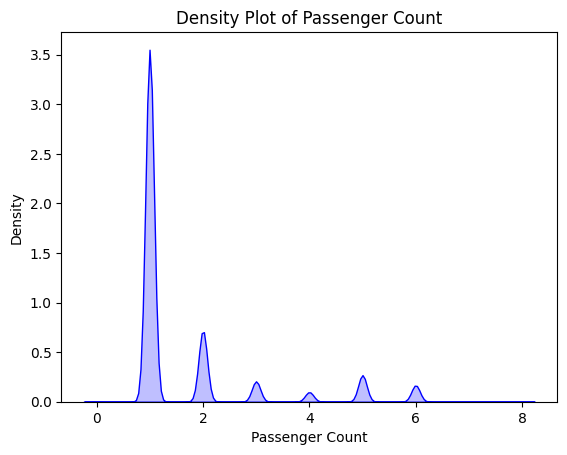

In [29]:
sns.kdeplot(data['passenger_count'], shade=True, color='blue')
plt.title('Density Plot of Passenger Count')
plt.xlabel('Passenger Count')
plt.ylabel('Density')
plt.show()



# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">Trip Duration (target variable)</span>

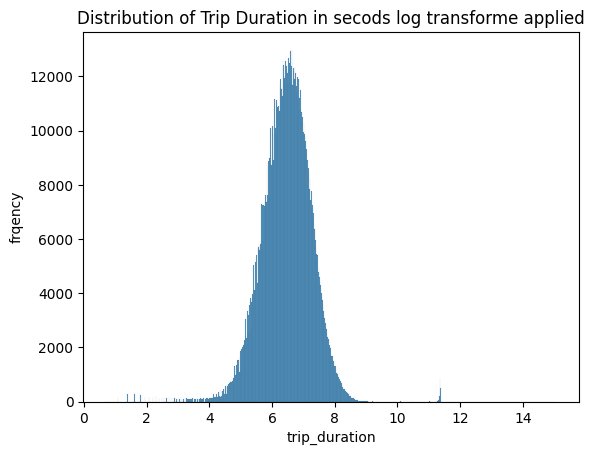

In [30]:
sns.histplot(data['trip_duration_log_transform'], label='trip_duration')
plt.title("Distribution of Trip Duration in secods log transforme applied")
plt.xlabel('trip_duration')
plt.ylabel("frqency")
plt.show()



# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">hour</span>

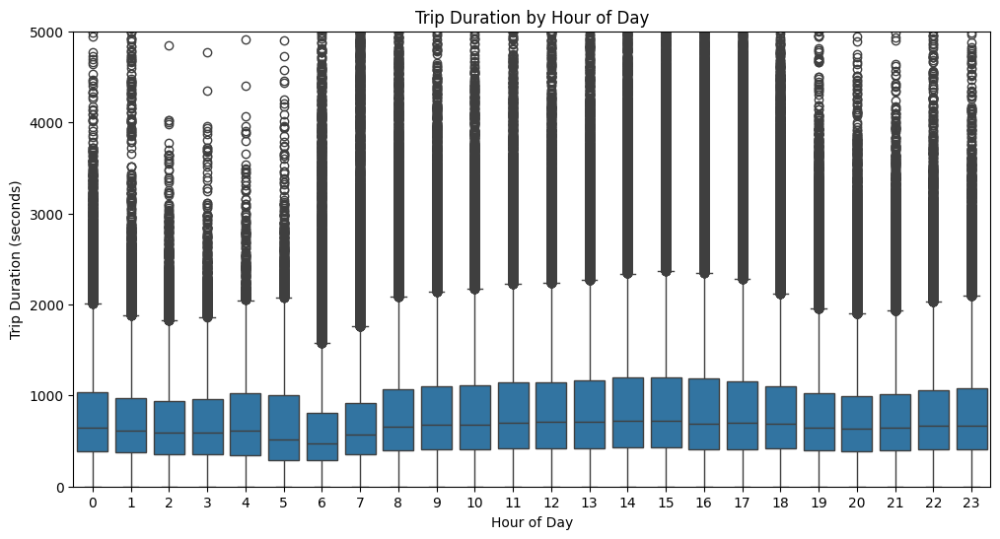

In [31]:
data['hour'] = pd.to_datetime(data['pickup_datetime']).dt.hour

plt.figure(figsize=(12, 6))
sns.boxplot(x='hour', y='trip_duration', data=data)
plt.ylim(0, 5000)  # Limit y-axis to exclude extreme outliers
plt.title('Trip Duration by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Trip Duration (seconds)')
plt.show()


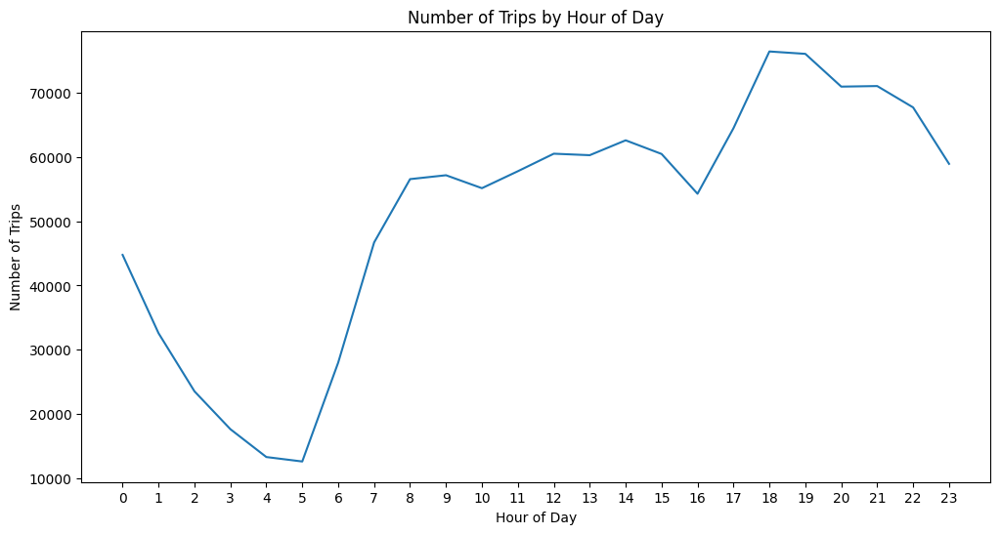

In [32]:
hourly_trips = data.groupby('hour').size()
plt.figure(figsize=(12, 6))
sns.lineplot(x=hourly_trips.index, y=hourly_trips.values)
plt.title('Number of Trips by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(range(0, 24))
plt.show()




# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">day of week</span>

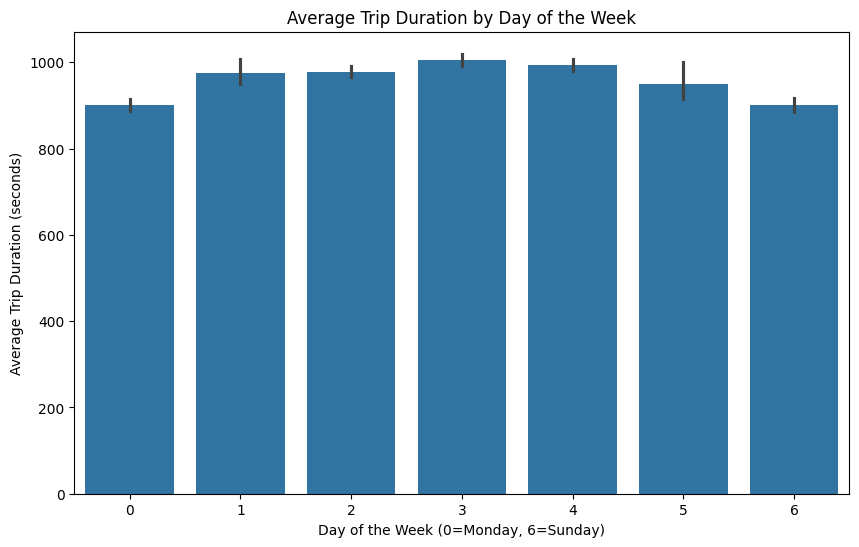

In [33]:
data['day_of_week'] = pd.to_datetime(data['pickup_datetime']).dt.dayofweek

plt.figure(figsize=(10, 6))
sns.barplot(x='day_of_week', y='trip_duration', data=data)
plt.title('Average Trip Duration by Day of the Week')
plt.xlabel('Day of the Week (0=Monday, 6=Sunday)')
plt.ylabel('Average Trip Duration (seconds)')
plt.show()


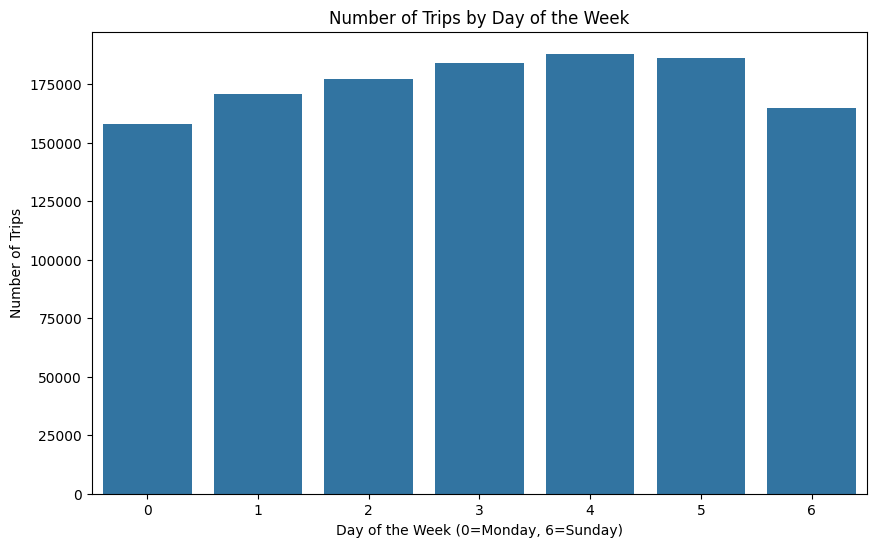

In [34]:
daily_trips = data.groupby('day_of_week').size()
plt.figure(figsize=(10, 6))
sns.barplot(x=daily_trips.index, y=daily_trips.values)
plt.title('Number of Trips by Day of the Week')
plt.xlabel('Day of the Week (0=Monday, 6=Sunday)')
plt.ylabel('Number of Trips')
plt.show()





# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">month</span>

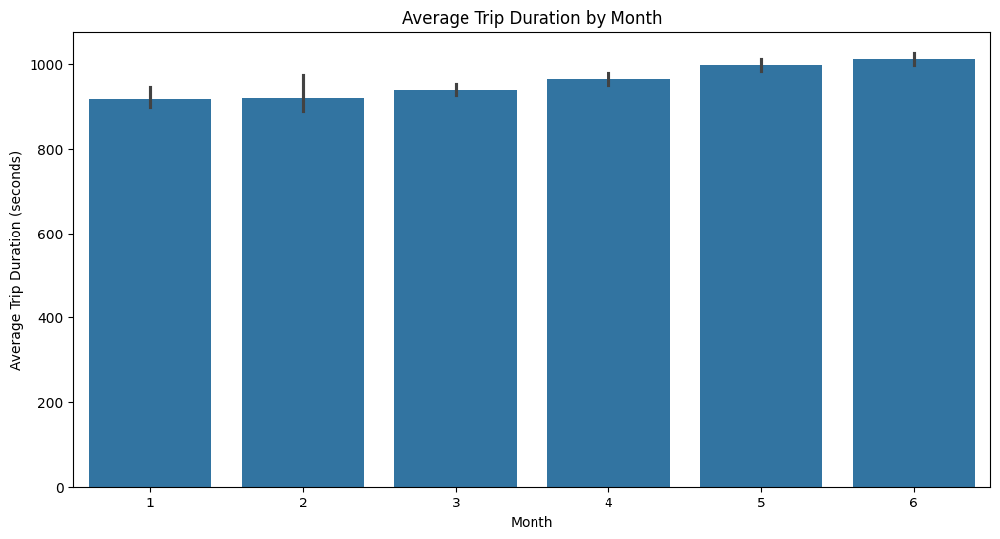

In [35]:
data['month'] = pd.to_datetime(data['pickup_datetime']).dt.month

plt.figure(figsize=(12, 6))
sns.barplot(x='month', y='trip_duration', data=data)
plt.title('Average Trip Duration by Month')
plt.xlabel('Month')
plt.ylabel('Average Trip Duration (seconds)')
plt.show()


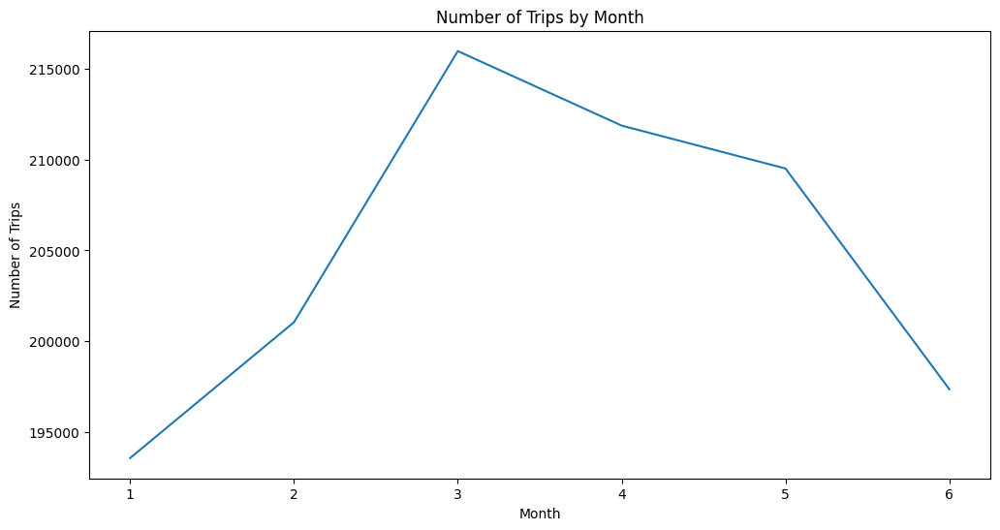

In [36]:
monthly_trips = data.groupby('month').size()
plt.figure(figsize=(12, 6))
sns.lineplot(x=monthly_trips.index, y=monthly_trips.values)
plt.title('Number of Trips by Month')
plt.xlabel('Month')
plt.ylabel('Number of Trips')
plt.show()





# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">is_weekend</span>

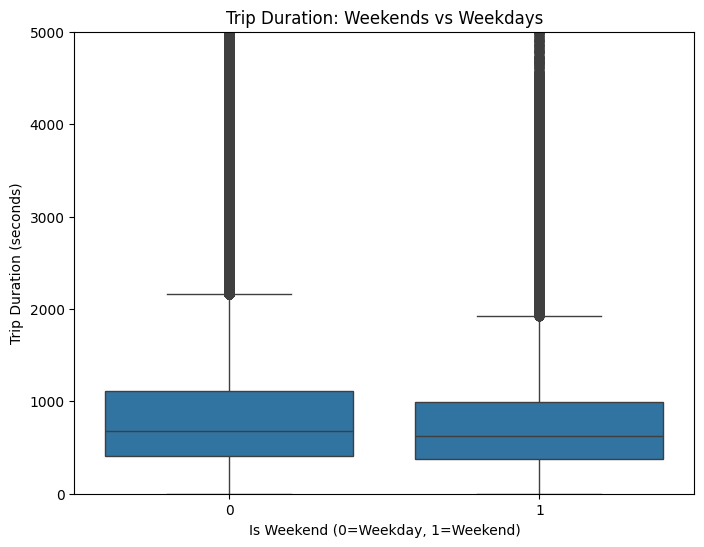

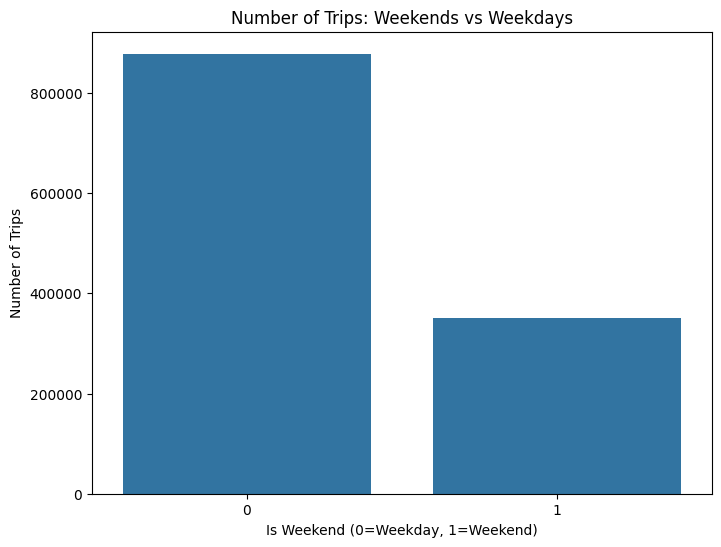

In [37]:
data['is_weekend'] = (data['day_of_week'] >= 5).astype(int)

plt.figure(figsize=(8, 6))
sns.boxplot(x='is_weekend', y='trip_duration', data=data)
plt.ylim(0, 5000)  # Limit y-axis to exclude extreme outliers
plt.title('Trip Duration: Weekends vs Weekdays')
plt.xlabel('Is Weekend (0=Weekday, 1=Weekend)')
plt.ylabel('Trip Duration (seconds)')
plt.show()

weekend_trips = data.groupby('is_weekend').size()
plt.figure(figsize=(8, 6))
sns.barplot(x=weekend_trips.index, y=weekend_trips.values)
plt.title('Number of Trips: Weekends vs Weekdays')
plt.xlabel('Is Weekend (0=Weekday, 1=Weekend)')
plt.ylabel('Number of Trips')
plt.show()



# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">Time of Day </span>


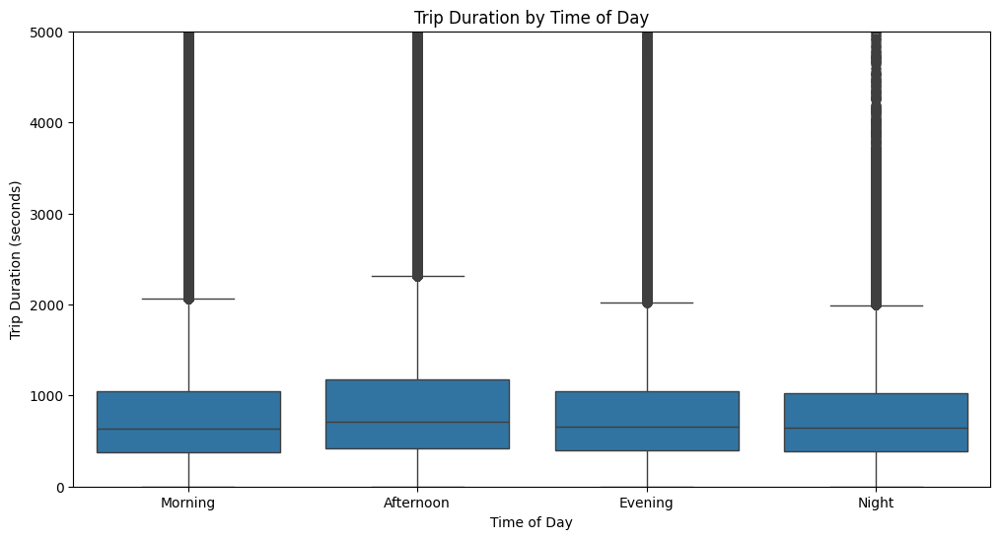

In [38]:
def time_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 22:
        return 'Evening'
    else:
        return 'Night'

data['time_of_day'] = data['hour'].apply(time_of_day)

plt.figure(figsize=(12, 6))
sns.boxplot(x='time_of_day', y='trip_duration', data=data, order=['Morning', 'Afternoon', 'Evening', 'Night'])
plt.ylim(0, 5000)  # Limit y-axis to exclude extreme outliers
plt.title('Trip Duration by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Trip Duration (seconds)')
plt.show()




# <span style="color:rgba(243, 238, 236, 0.86); font-size: 46px; text-align: left;">Bivariate Analysis</span>


    
    
# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">- Vendor_Id vs trip_duration</span>




    

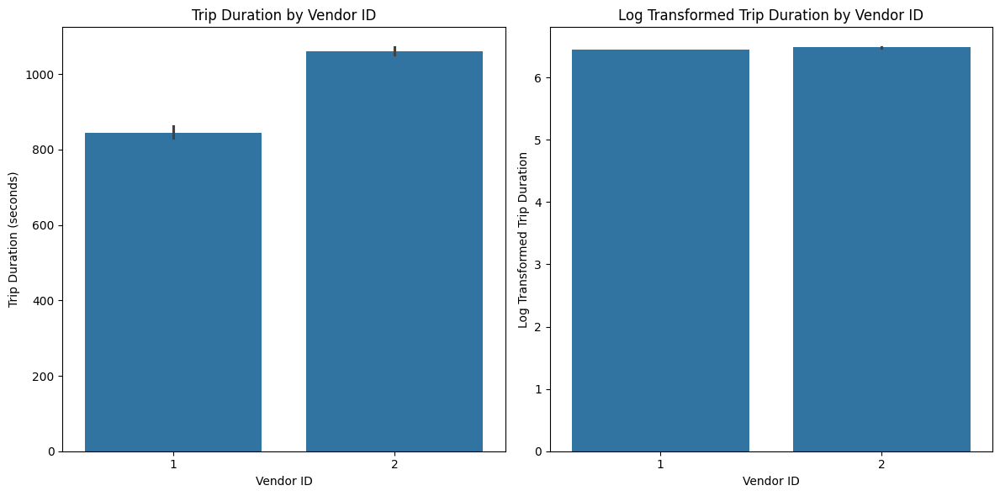

In [39]:
# Create a figure and two subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns

# Plot the first bar plot on the first axis
sns.barplot(ax=axes[0], x=data['vendor_id'], y=data['trip_duration'])
axes[0].set_xlabel('Vendor ID')
axes[0].set_ylabel('Trip Duration (seconds)')
axes[0].set_title('Trip Duration by Vendor ID')

# Plot the second bar plot on the second axis
sns.barplot(ax=axes[1], x=data['vendor_id'], y=data['trip_duration_log_transform'])
axes[1].set_xlabel('Vendor ID')
axes[1].set_ylabel('Log Transformed Trip Duration')
axes[1].set_title('Log Transformed Trip Duration by Vendor ID')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

#### Observations from the Two Graphs  

- **Vendor 2** has a higher average trip duration compared to **Vendor 1** in the raw data.  
- Applying a **log transformation** reduces the impact of extreme values, making the data distribution more **normalized**.  
- The difference between the two vendor IDs appears **less pronounced** after the transformation.  
- Without transformation, the raw data may be **skewed** due to **outliers** or **unusually long trips**.  
- The transformation helps in achieving a **more balanced comparison** between the two vendors.  


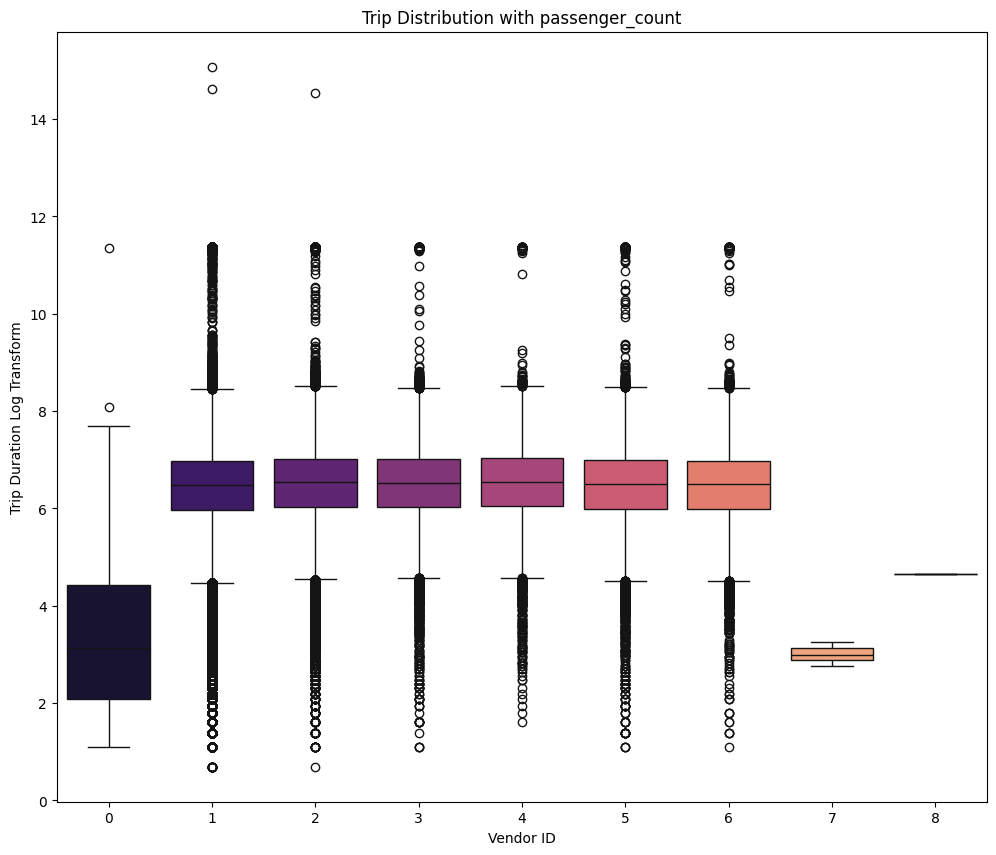

In [40]:
plt.figure(figsize=(12,10))
sns.boxplot(data=data, x='passenger_count', y='trip_duration_log_transform', palette='magma')
plt.title("Trip Distribution with passenger_count")
plt.xlabel("Vendor ID")
plt.ylabel("Trip Duration Log Transform")
plt.show()

### Trip Distribution with passenger_count  
This graph visualizes the **distribution of trip durations** (log-transformed) in relation to passenger counts.  

**Key Observations:**  
- **Time Duration Range**: Trip durations span from **0 hours** (instantaneous) to **7 hours**, with log transformation applied to normalize the scale.  
- **Passenger Count Focus**: The data likely explores how trip durations vary with the number of passengers (e.g., longer trips for higher passenger counts).  
- **Measurement Intervals**: Time bins are segmented hourly (e.g., *0:00:00*, *1:00:00*), suggesting analysis of trip duration frequency over these intervals.  

**Trend Significance**:  
- The log transform indicates potential skewness in raw trip duration data, emphasizing patterns in shorter or more frequent trips.  
- The absence of "Vendor ID" data implies the graph isolates passenger count and duration relationships, excluding vendor-specific trends.  

**Summary**:  
*The graph highlights trip duration distribution (log-scaled) across hourly intervals, emphasizing correlations with passenger count.*  


# <span style="color:rgb(245, 219, 211); font-size: 36px; text-align: left;">- Trip Duration by Traffic Indicator(store_and_fwd_flag)</span>

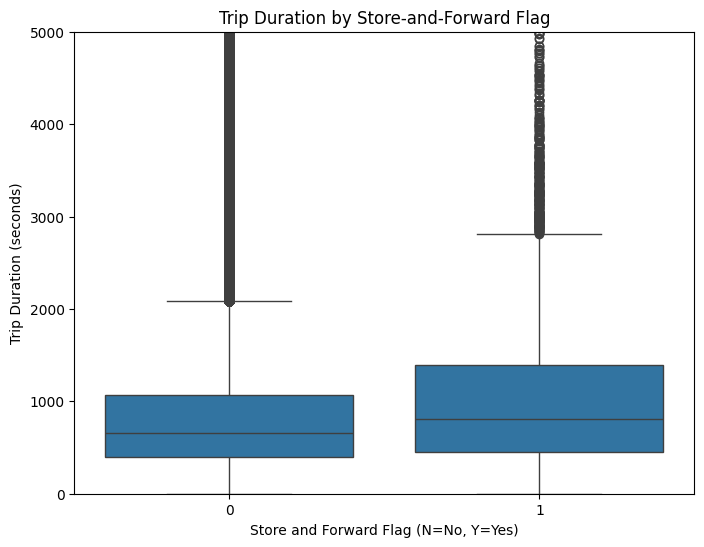

In [41]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='store_and_fwd_flag', y='trip_duration', data=data)
plt.ylim(0, 5000)  # Limit y-axis to exclude extreme outliers
plt.title('Trip Duration by Store-and-Forward Flag')
plt.xlabel('Store and Forward Flag (N=No, Y=Yes)')
plt.ylabel('Trip Duration (seconds)')
plt.show()


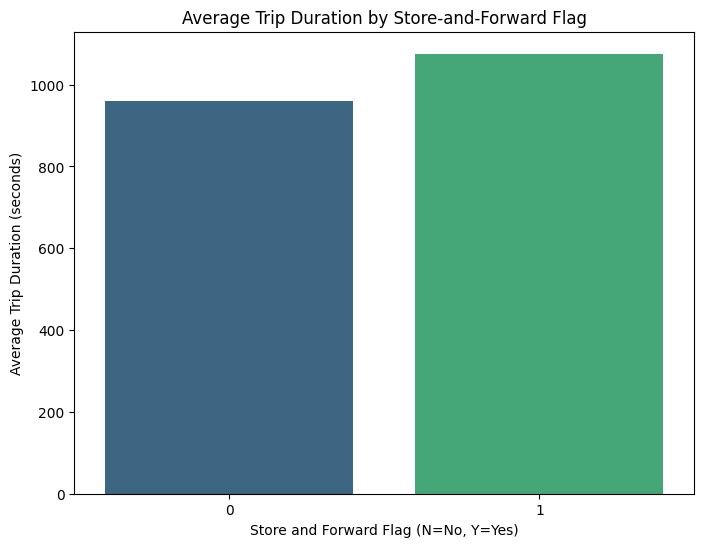

In [42]:
# Average Trip Duration by store_and_fwd_flag
avg_duration = data.groupby('store_and_fwd_flag')['trip_duration'].mean()

plt.figure(figsize=(8, 6))
sns.barplot(x=avg_duration.index, y=avg_duration.values, palette='viridis')
plt.title('Average Trip Duration by Store-and-Forward Flag')
plt.xlabel('Store and Forward Flag (N=No, Y=Yes)')
plt.ylabel('Average Trip Duration (seconds)')
plt.show()


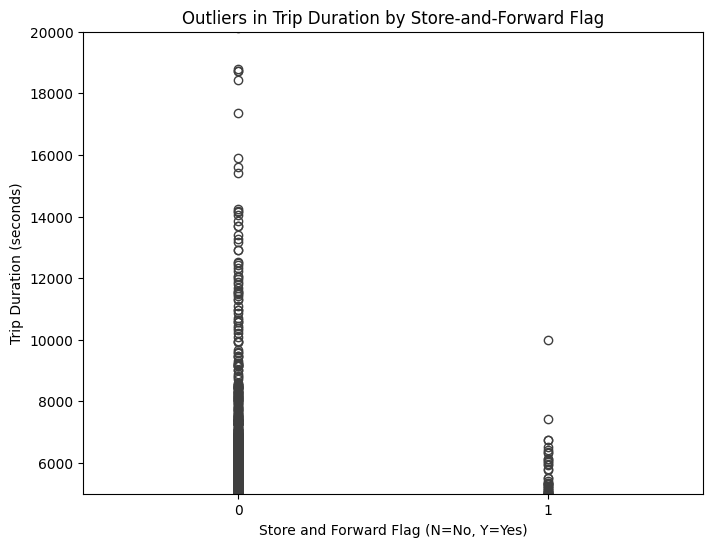

In [43]:
# Outlier Analysis
# Trip Duration Outliers for store_and_fwd_flag

plt.figure(figsize=(8, 6))
sns.boxplot(x='store_and_fwd_flag', y='trip_duration', data=data)
plt.ylim(5000, 20000)  # Focus on outliers
plt.title('Outliers in Trip Duration by Store-and-Forward Flag')
plt.xlabel('Store and Forward Flag (N=No, Y=Yes)')
plt.ylabel('Trip Duration (seconds)')
plt.show()


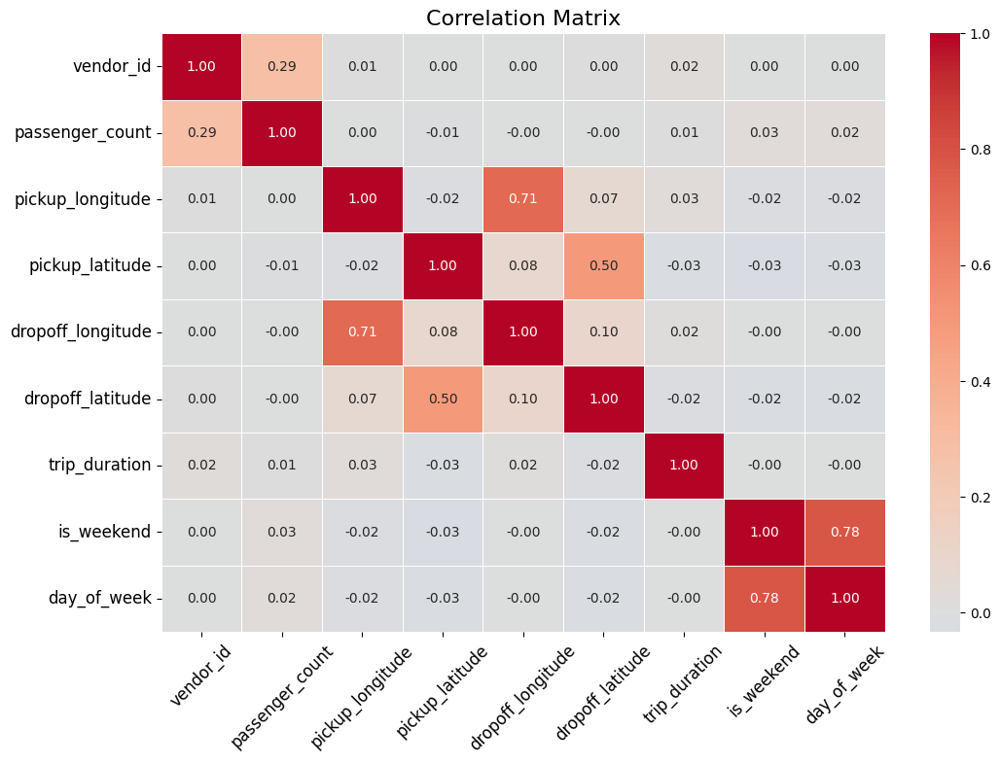

In [49]:
# Drop unnecessary columns and compute the correlation matrix
correlation_matrix = data.drop(columns=["pickup_datetime", "store_and_fwd_flag","trip_duration_log_transform",
                                        "trip_duration_minutes","hour","month","distance" ,"weekday", "time_of_day"]).corr()

# Visualize the correlation matrix with improved formatting
plt.figure(figsize=(12, 8))  # Adjust figure size for clarity
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap='coolwarm', 
    center=0, 
    linewidths=0.5,  # Add space between cells
    fmt=".2f"  # Format correlation values to 2 decimal places
)
plt.title("Correlation Matrix", fontsize=16)
plt.xticks(fontsize=12, rotation=45)  # Rotate x-axis labels for better visibility
plt.yticks(fontsize=12)
plt.show()




The correlation matrix visualizes the relationships between different numerical features in the dataset. 
 
**Key Observations from the Correlation Matrix**  
- **`vendor_id`**: Shows a weak correlation with other variables, except for **`passenger_count` (0.29)**, suggesting that some vendors may serve larger groups more frequently.  
- **`passenger_count`**: Has a weak correlation with all features, indicating that the number of passengers does not significantly influence trip duration or location-related variables.  
- **`pickup_longitude` & `dropoff_longitude` (0.71 correlation)**: This strong correlation suggests that trips often follow specific longitude patterns, likely along major roads or routes.  
- **`pickup_latitude` & `dropoff_latitude` (0.50 correlation)**: Exhibits a moderate correlation, meaning that pickup and drop-off locations tend to align but show more variation than longitude.  
- **`trip_duration`**: Has very weak correlations with other features, implying that trip duration is influenced by external factors not captured in this dataset (e.g., traffic conditions, time of day).  
- **`is_weekend` & `day_of_week` (0.78 correlation)**: A high correlation is expected since **`is_weekend`** is derived from **`day_of_week`**, where certain values indicate weekends (Saturday & Sunday).  

 **Insights & Implications**  
- The dataset does not show a **strong direct correlation** between **`trip_duration`** and geographical or categorical features, suggesting that additional factors (e.g., traffic, time of day, weather) may play a crucial role.  
- The **high correlation between pickup and drop-off longitude/latitude** indicates that trips are often concentrated in specific areas, likely following a structured urban layout.  
- Since **`vendor_id`** and **`passenger_count`** have low correlations with **`trip_duration`**, these features may have minimal predictive power for estimating trip time.  


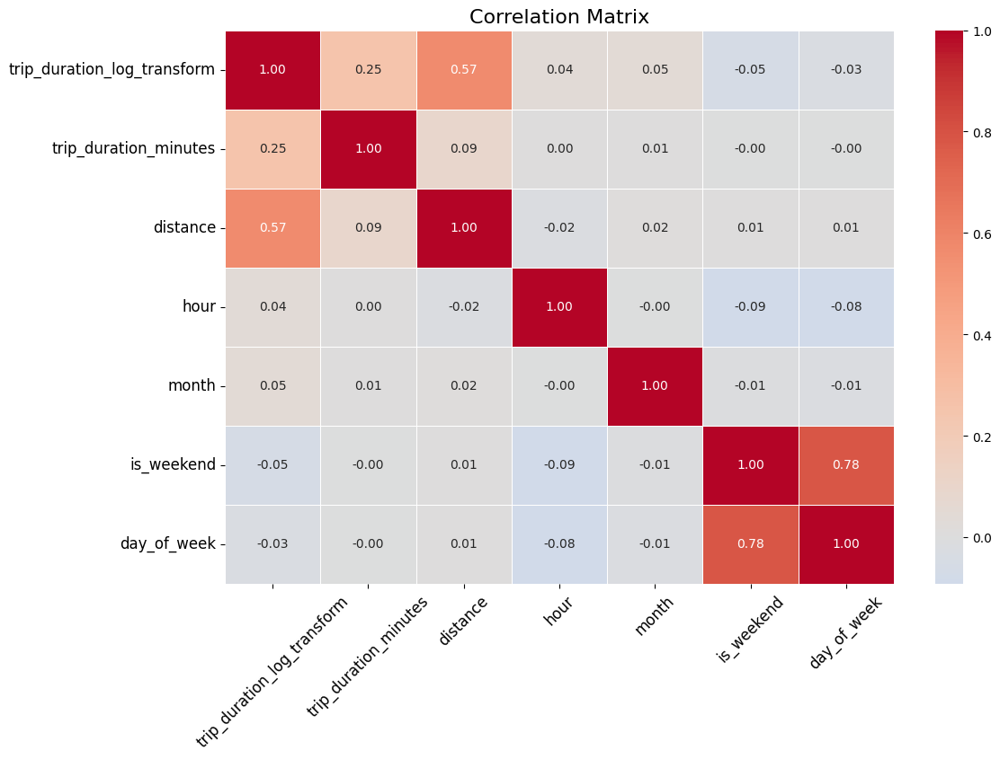

In [53]:
# Drop unnecessary columns and compute the correlation matrix
correlation_matrix = data.drop(columns=["vendor_id", "pickup_datetime", "passenger_count", "pickup_longitude", "pickup_latitude", "dropoff_longitude", "dropoff_latitude",
                                        "store_and_fwd_flag", "trip_duration", "weekday", "time_of_day"]).corr()

# Visualize the correlation matrix with improved formatting
plt.figure(figsize=(12, 8))  # Adjust figure size for clarity
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap='coolwarm', 
    center=0, 
    linewidths=0.5,  # Add space between cells
    fmt=".2f"  # Format correlation values to 2 decimal places
)
plt.title("Correlation Matrix", fontsize=16)
plt.xticks(fontsize=12, rotation=45)  # Rotate x-axis labels for better visibility
plt.yticks(fontsize=12)
plt.show()

 

The correlation matrix visualizes the relationships between different numerical features in the dataset. Below is an explanation of the key columns based on their correlation values:  

**Key Observations from the Correlation Matrix**  
- **`trip_duration_log_transform` & `distance` (0.57 correlation)**: This moderate correlation suggests that longer trips generally cover more distance, though other factors may still influence trip duration.  
- **`trip_duration_minutes`**: Has a weak correlation with most features, indicating that trip duration in minutes is not strongly dependent on individual attributes like time or day.  
- **`distance`**: Shows a noticeable correlation (0.57) with **`trip_duration_log_transform`**, reinforcing the expected relationship between trip length and duration. However, it has minimal correlation with other time-based features like `hour` and `month`.  
- **`hour` & `trip_duration_log_transform` (0.04 correlation)**: A near-zero correlation suggests that the hour of the trip does not significantly affect trip duration.  
- **`is_weekend` & `day_of_week` (0.78 correlation)**: A high correlation is expected since **`is_weekend`** is derived from **`day_of_week`**, where certain values indicate weekends (Saturday & Sunday).  
- **`month`**: Shows almost no correlation with trip duration, implying that seasonality does not have a major impact on trip time.  

**Insights & Implications**  
- **Trip duration is moderately correlated with distance**, but other factors, such as traffic and route selection, may still play a role in predicting trip time.  
- **Time-based features (`hour`, `month`, `is_weekend`) show very weak correlations with trip duration**, suggesting that time alone is not a strong predictor.  
- **The correlation between `is_weekend` and `day_of_week` is expected**, confirming the consistency of the derived feature.  
- **Feature engineering efforts should focus on additional factors**, such as traffic patterns or weather conditions, which may improve predictive performance.  
